# Рынок заведений общественного питания Москвы

Проект для фонда "Shut Up and Take My Money". Фонд открывает заведение общественного питания в Москве и попросил нас изучить особенности, закономерности рынка Москвы, чтобы определиться с местом и видом заведения.

**Цель:** \
Помощь инвесторам фонда в выборе места и вида заведения путем анализа и поиска особенностей рынка общественного питания Москвы.

**Описание данных:** \
Получен датасет `moscow_places.csv` с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
- name — название заведения
- address — адрес заведения
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»
- hours — информация о днях и часах работы
- lat — широта географической точки, в которой находится заведение
- lng — долгота географической точки, в которой находится заведение
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: \
«Средний счёт: 1000–1500 ₽» \
«Цена чашки капучино: 130–220 ₽» \
«Цена бокала пива: 400–600 ₽» \
и так далее
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: \
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. \
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. \
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: \
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. \
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. \
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт. \
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): \
0 — заведение не является сетевым \
1 — заведение является сетевым 
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Ход исследования:**
1. Ознакомление с данными
2. Предобработка данных
3. Исследовательский анализ
4. Детализация исследования: открытие кофейни

## Шаг 1: Ознакомление с данными

In [2]:
pip install --upgrade matplotlib

     |████████████████████████████████| 11.6 MB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 299 kB 87.7 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 89.2 MB/s eta 0:00:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.3.4
    Uninstalling matplotlib-3.3.4:
      Successfully uninstalled matplotlib-3.3.4
Note: you may need to restart the kernel to use updated packages.


In [3]:
# импортируем нужные библиотеки
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import folium
import re
import json
import warnings

In [4]:
# исключим красные предупреждения
warnings.filterwarnings('ignore')

In [5]:
# зададим настройки для графиков
sns.set(rc={'figure.figsize':(14,8)})
plt.style.use('seaborn-pastel')

In [6]:
# прочитаем файл с датасетом
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

In [7]:
# выведем первые 10 строк 
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [8]:
# посмотрим общую информацию
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете хранится информация о 8406 заведениях города. Есть заведения различных категорий от пиццерий и кофеен до ресторанов. Так как информацию добавляли сами пользователи могут встречаться неточности и пропуски, поэтому нужно будет изучить датасет детальнее и провести предобработку.

## Шаг 2: Предобработка данных

### Работа с пропусками

Для начала посмотрим на количество пропусков в датасете.

In [9]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

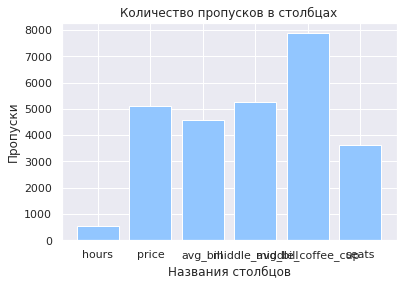

In [10]:
# для наглядности построим график
miss_data = places.isna().sum(axis=0).reset_index()
miss_data.columns = ['column', 'missing']
miss_data = miss_data[miss_data['missing'] != 0]
miss_data['percent'] = (miss_data['missing'] / len(places))*100
plt.bar(miss_data['column'], miss_data['missing']);
plt.title('Количество пропусков в столбцах');
plt.ylabel('Пропуски');
plt.xlabel('Названия столбцов');
plt.show();

In [11]:
# также выведем долю пропусков в каждом столбце
miss_data[['column','percent']]

,column,percent
4,hours,6.376398
8,price,60.563883
9,avg_bill,54.603854
10,middle_avg_bill,62.538663
11,middle_coffee_cup,93.635498
13,seats,42.957411


Довольно много пропусков в данном датасете. Что неудивительно, ведь информация добавляется пользователями. Большая часть пропусков связана с данными о ценах, лишь совсем малая часть заведений имеет информацию о средней стоимости чашечки кофе. При этом категорию цен (средняя, выше среднего и тд) мы можем добавить, зная средний чек. Если в среднем чеке есть информация о стоимости чашки кофе, мы тоже можем ее добавить в соответствующий столбец. Однако остальные столбцы заполнить не получится. Смысла добавлять медианные или средние значения нет - это исказит информацию. Можем установить категорию 'unknown' для тех заведений, где неизвестен средний чек и ценовая категория. Это позволит учитывать их при дальнейшем анализе. \
В столбце со стоиомостью чашечки капучино аж 93.6% значений отсуствуют! Это может связано с тем, что не во всех заведениях рационально указывать именно эту стоимость, цена чашки кофе - это, скорее, показатель именно кофейни, а не всех остальных.

Конечно, в реальной жизни можно было бы попробовать заморочиться и найти часть информации на официальных сайтах заведений, но в учебном проекте вряд ли это требуется от нас, поэтому рабоатем с тем, что имеем.

In [12]:
# посмотрим, есть ли заведения, где не указана категория цены, но есть средний чек
places.loc[(places['price'].isna()) & ~(places['middle_avg_bill'].isna())]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879324,37.480280,4.1,NaN,Средний счёт:от 240 ₽,240.0,NaN,0,4.0
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8347,Compass Coffee&Bakery,кафе,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,"пн-пт 10:00–22:00; сб,вс 11:00–22:00",55.712435,37.752065,4.0,NaN,Средний счёт:300–400 ₽,350.0,NaN,0,80.0
8366,Ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.708143,37.808957,4.2,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,4.0
8383,Pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.698824,37.738878,4.2,NaN,Средний счёт:150 ₽,150.0,NaN,0,NaN
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0


In [13]:
# посмотрим категории цен
places['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [14]:
# выведем границы категорий по среднему чеку
print(f'Низкие цены от {places.loc[places["price"] == "низкие"]["middle_avg_bill"].min()} \
до {places.loc[places["price"] == "низкие"]["middle_avg_bill"].max()}')
print(f'Средние цены от {places.loc[places["price"] == "средние"]["middle_avg_bill"].min()} \
до {places.loc[places["price"] == "средние"]["middle_avg_bill"].max()}')
print(f'Выше среднего цены от {places.loc[places["price"] == "выше среднего"]["middle_avg_bill"].min()} \
до {places.loc[places["price"] == "выше среднего"]["middle_avg_bill"].max()}')
print(f'Высокие цены от {places.loc[places["price"] == "высокие"]["middle_avg_bill"].min()} \
до {places.loc[places["price"] == "высокие"]["middle_avg_bill"].max()}')

Низкие цены от 90.0 до 600.0
Средние цены от 165.0 до 2150.0
Выше среднего цены от 375.0 до 4500.0
Высокие цены от 0.0 до 35000.0


Довольно разнятся категории и цены. Например, категория средняя цена ставится некоторым заведениям с чеком 165 рублей. При этом низкие доходят до 600. Возможно, это зависит от категории заведения. Например, средний чек 1000 рублей в ресторане и средний чек 1000 рублей в кофейне - это разные категории.

In [15]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [16]:
average_prices = places.pivot_table(index='category', columns='price', values='middle_avg_bill', aggfunc=['min', 'median']) \
.reset_index()
average_prices

category     min                               median  \
price                  высокие выше среднего низкие средние высокие   
0              бар,паб  1750.0         375.0  150.0   165.0  2000.0   
1             булочная  1750.0         500.0  150.0   200.0  2500.0   
2      быстрое питание  2750.0        1200.0   90.0   200.0  3200.0   
3                 кафе   950.0        1100.0  100.0   200.0  2000.0   
4              кофейня     0.0         700.0  120.0   200.0  2000.0   
5             пиццерия  1650.0        1000.0  150.0   199.0  1900.0   
6             ресторан  1000.0         750.0  120.0   200.0  2250.0   
7             столовая  3750.0        1200.0  125.0   195.0  3750.0   

                                    
price выше среднего низкие средние  
0            1250.0  170.0   850.0  
1            1225.0  150.0   442.5  
2            1250.0  150.0   400.0  
3            1250.0  150.0   500.0  
4            1250.0  145.5   400.0  
5            1250.0  225.0   670.0  
6            1250.0  300.0   700.0  
7            1225.0  212.5   300.0

Есть небольшие отличия в средних чеках и категориях цен по разным видам заведений. Но в целом многие меданные значения схожи, чтобы не добавлять себе лишней работы, назначим категории цен так:
- высокие - от 1750р
- выше среднего - от 1000р
- средние - от 300р
- низкие - менее 300р

In [17]:
places.loc[(places['middle_avg_bill'] >= 1750) & places['price'].isna(), 'price'] = 'высокие'
places.loc[(places['middle_avg_bill'] >= 1000) & places['price'].isna(), 'price'] = 'выше среднего'
places.loc[(places['middle_avg_bill'] >=300) & places['price'].isna(), 'price'] = 'средние'
places.loc[(places['middle_avg_bill'] < 300) & places['price'].isna(), 'price'] = 'низкие'

In [18]:
# посмотрим на результат
places['price'].isna().sum()

4621

Немного пропусков нам удалось заполнить, остальные будут категории неизвестной:

In [19]:
places['price'] = places['price'].fillna('unknown')
places['price'].isna().sum()

0

Посмотрим, вдруг возникла какая-то ошибка при выгрузке и средние чеки не выгрузились, хотя были указаны в датасете.

In [20]:
places.loc[~(places['avg_bill'].isna()) & (places['middle_avg_bill'].isna()) \
           & (places['middle_coffee_cup'].isna())]['avg_bill'].unique()

array(['Цена бокала пива:250–350 ₽', 'Цена бокала пива:120–350 ₽',
       'Цена бокала пива:90–230 ₽', 'Цена бокала пива:160–499 ₽',
       'Цена бокала пива:199–300 ₽', 'Цена бокала пива:от 140 ₽',
       'Цена бокала пива:от 149 ₽', 'Цена бокала пива:150–450 ₽',
       'Цена бокала пива:130–150 ₽', 'Цена бокала пива:220–350 ₽',
       'Цена бокала пива:180–330 ₽', 'Цена бокала пива:220–550 ₽',
       'Цена бокала пива:150–290 ₽', 'Цена бокала пива:320–440 ₽',
       'Цена бокала пива:370–410 ₽', 'Цена бокала пива:320–460 ₽',
       'Цена бокала пива:180–420 ₽', 'Цена бокала пива:280 ₽',
       'Цена бокала пива:150–350 ₽', 'Цена бокала пива:270–390 ₽',
       'Цена бокала пива:200–440 ₽', 'Цена бокала пива:380–400 ₽',
       'Цена бокала пива:260–380 ₽', 'Цена бокала пива:200–300 ₽',
       'Цена бокала пива:от 350 ₽', 'Цена бокала пива:от 200 ₽',
       'Цена бокала пива:100–250 ₽', 'Цена бокала пива:от 195 ₽',
       'Цена бокала пива:240–380 ₽', 'Цена бокала пива:160–350 ₽',
     

Нет, выходит, где пропущены значения среднего чека и стоимости чашки кофе, там нет этой информации. В основном это бары и пабы, где указана цена за бокал пива.

Посмотрим, что за заведения, где не указаны часы работы:

In [21]:
places.loc[places['hours'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,unknown,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,unknown,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,unknown,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,unknown,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,unknown,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,unknown,NaN,NaN,NaN,0,NaN
8375,Улица Гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,unknown,NaN,NaN,NaN,0,NaN
8378,Восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.710540,37.767864,4.3,unknown,NaN,NaN,NaN,0,120.0
8381,Аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.708871,37.803831,3.8,unknown,NaN,NaN,NaN,0,30.0


Мда, об этих заведениях вообще мало информации. Посмотрим, есть ли те, у которых есть хотя бы информация по среднему чеку.

In [22]:
len(places.loc[(places['hours'].isna()) & ~(places['avg_bill'].isna())])

8

Небольшое количество, но есть. Не будем удалять из датасета эти заведения, так как в них есть другая нужная инфрмация о расположении и рейтинге. Но заменим пропуски в часах работы на unknown.

In [23]:
places['hours'] = places['hours'].fillna('unknown')
places['hours'].isna().sum()

0

Остальные пропуски заменять мы не будем. Я не очень люблю "затычки" в виде 999 и прочих, ставить категорию "неизвестный" в числовых данных тоже нет практического смысла, поэтому оставим так.

Приступим к обработке дубликатов

### Работа с дубликатами

In [24]:
# найдем явные дубликаты
places.duplicated().sum()

0

Явных дубликатов нет. Неявные могут встретиться в столбцах с категориями (его мы выше смотрели, там нет неявных), могут также встретиться в названии округов.

In [25]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Явных и неявных дубликатов нет.

### Добавление столбцов

Добавим столбец с названием улицы из адреса.

In [26]:
# для начала сохраним каждый элемент адреса в список списков
streets = places['address'].str.split(',')
list(streets)

[['Москва', ' улица Дыбенко', ' 7/1'],
 ['Москва', ' улица Дыбенко', ' 36', ' корп. 1'],
 ['Москва', ' Клязьминская улица', ' 15'],
 ['Москва', ' улица Маршала Федоренко', ' 12'],
 ['Москва', ' Правобережная улица', ' 1Б'],
 ['Москва', ' Ижорская улица', ' вл8Б'],
 ['Москва', ' Клязьминская улица', ' 9', ' стр. 3'],
 ['Москва', ' Клязьминская улица', ' 9', ' стр. 3'],
 ['Москва', ' Дмитровское шоссе', ' 107', ' корп. 4'],
 ['Москва', ' Ангарская улица', ' 39'],
 ['Москва', ' Левобережная улица', ' 12'],
 ['Москва', ' улица Маршала Федоренко', ' 10с1'],
 ['Москва', ' МКАД', ' 80-й километр', ' 1'],
 ['Москва', ' Базовская улица', ' 15', ' корп. 1'],
 ['Москва', ' Ангарская улица', ' 42с1'],
 ['Москва', ' улица Бусиновская Горка', ' 2'],
 ['Москва', ' Базовская улица', ' 15', ' корп. 8'],
 ['Москва', ' Ленинградское шоссе', ' 71Б', ' стр. 2'],
 ['Москва', ' Коровинское шоссе', ' 30А'],
 ['Москва', ' Ижорский проезд', ' 5'],
 ['Москва', ' Правобережная улица', ' 1Б'],
 ['Москва', ' Прибре

In [27]:
# теперь добавим в столбец с улицей соответствующую улицу из списка
for i in range(len(places)):
    places.loc[i, 'street'] = streets[i][1]

In [28]:
# посмотрим на результат
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица


Теперь создадим столбец, где будет указано, работает ли заведение круглосуточно или нет

In [29]:
hours = places['hours'].str.split().to_list()
for i in range(len(places)):
    if hours[i][0] == 'ежедневно,' and hours[i][1] == 'круглосуточно':
        places.loc[i, 'is_24/7'] = True
    else:
        places.loc[i, 'is_24/7'] = False

In [30]:
# проверим результат
places.loc[places['is_24/7'] == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Левобережная улица,True
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,unknown,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,unknown,NaN,NaN,NaN,1,NaN,улица Дыбенко,True
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,средние,Средний счёт:900 ₽,900.0,NaN,0,NaN,Ижорская улица,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,Намангале,кафе,"Москва, Ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,unknown,NaN,NaN,NaN,0,NaN,Ферганская улица,True
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,низкие,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,Болотниковская улица,True
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,unknown,NaN,NaN,NaN,1,150.0,Люблинская улица,True


Все нужные столбцы добавлены.

**Вывод:** \
На данном этапе была проведена предобработка данных. Обнаружено большое количество пропусков в столбцах, которые касаюстя цен. Это связано со спецификой заведений (например, в барах и пабах указана цена за бокал пива вместо среднего чека), также связано с тем, что информацию заполняют посетители, не везде они могут охотно это делать. Да и, в принципе, часто встречаются заведения, где не указан средний чек и прочие цены. \ 
Небольшая часть пропусков в столбце `price` была заменена на значения, опираясь на средний чек, другие пропуски в этом столбце были обозначены unknown. \
Остальные пропуски в столбцах с ценами я менять не стала, так как не вижу в этом практической ценности. 

Также есть заведения, где не указаны часы работы и количество посадочных мест. В реальной практике можно было бы попробовать добыть информацию с официальных сайтов заведений (если он есть), но в учебном проекте этого делать не стоит. Поставила категорию unknown там, где пропущены часы работы, остальные прпоуски оставила без изменений.

Явных и неявных дубликатов в датасете не обнаружено.

Также на этом шаге в датасет было добавлено два столбца: `street` - с названием улицы, где расположено заведение, и `is_24/7` - где указано, работает ли заведение круглосуточно или нет.

## Шаг 3: Анализ данных

### Распределение заведений по категориям

Посмотрим, какие категории заведений представлены в данном файле и как они распределены.

In [31]:
# сначала выведем количество
places['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

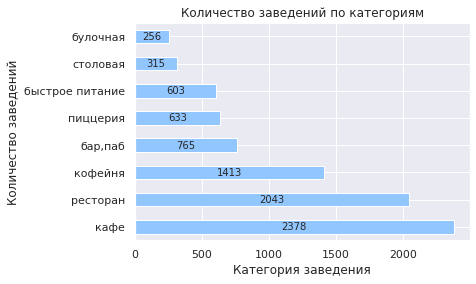

In [32]:
# наглядно отобразим на графике
ax = places['category'].value_counts().plot.barh()
ax.bar_label(ax.containers[0], label_type='center')
plt.title('Количество заведений по категориям');
plt.xlabel('Категория заведения');
plt.ylabel('Количество заведений');
plt.show();

Большее количество заведений относится к категории кафе. С небольшим отставанием на втором месте рестораны. А вот остальных категорий уже значительно меньше. Реже всего в Москве встречаются булочные и столовые.

Посмотрим теперь, как количество посадочных мест распределено по категориям заведений:

In [33]:
# у нас были анмоальные значения в количестве посадочных мест, поэтому посмотрим описание данных
places['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Я решила аномальные значения не удалять и датасета, но не включать в графики, поэтому верхнюю границу найдем с помощью перцентилей, а нижнюю границу с помощью функции нахождения "усов" - 1.5 межквартильных размаха.

In [34]:
np.percentile(places.loc[~(places['seats'].isna()), 'seats'], [95, 99]) 

array([307., 625.])

In [35]:
# функция нахождения усов
def whiskers (column):
    describe = places[column].describe()
    q = describe[6] - describe[4]
    left = describe[4] - 1.5*q
    right = describe[6] + 1.5*q
    if left < describe[3]:
        left = describe[3]
    if right > describe[7]:
        right = describe[7]
    return [left, right]

In [36]:
whiskers('seats')

[0.0, 290.0]

Посмотрим на рапспределение количества мест во всех заведениях без привязки к категориям и сетям.

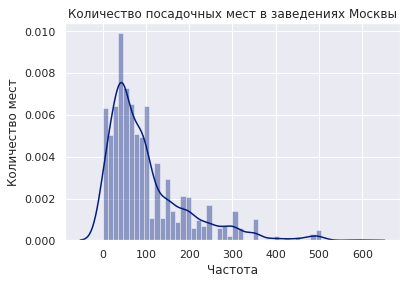

In [37]:
with plt.style.context('seaborn-dark-palette'):
    sns.distplot(places.loc[places['seats'] < 625, 'seats']);
    plt.title('Количество посадочных мест в заведениях Москвы');
    plt.xlabel('Частота');
    plt.ylabel('Количество мест');
    plt.show();

Большее количество заведений рассчитаны на 40-50 посадочных мест, хотя есть и довольно крупные места с вместимостью 200-300 человек. Такие заведения относятся к общегородским предприятиям и имеют свои нюансы проектировки и выбора мест. Поэтому вполне ожидаемо, что большее число заведений среднего размера.

Теперь можно рассматривать количество посадочных мест по категориям:

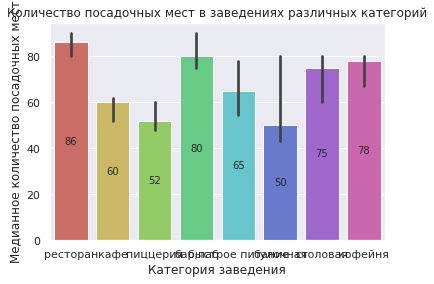

In [38]:
# теперь построим график, исключив аномально высокие значения, используя медиану мест по категориям
ax = sns.barplot(x='category', y='seats', data=places.loc[places['seats'] < 625], estimator=np.median, palette='hls');
ax.bar_label(ax.containers[0], label_type='center')
plt.title('Количество посадочных мест в заведениях различных категорий');
plt.xlabel('Категория заведения');
plt.ylabel('Медианное количество посадочных мест');
plt.show();

Наибольшее количество посадочных мест имеют рестораны (медиана более 80), на втором месте бары и пабы, что немного удивляет, затем идут кофейни. Странно, что кафе далеко не в лидерах по количеству мест, но данные говорят об этом. Ну а меньшее количество посадочных мест имеют булочные Москвы.

Посмотрим, как количество посадочных мест распределено в сетевых и несетевых заведениях:

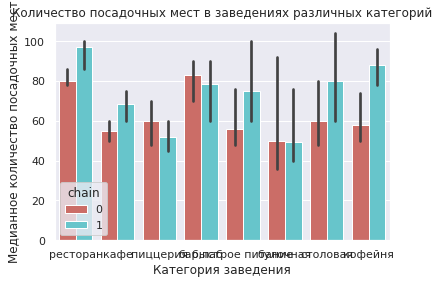

In [39]:
sns.barplot(x='category', y='seats', hue='chain', data=places.loc[places['seats'] < 625], estimator=np.median, palette='hls');
plt.title('Количество посадочных мест в заведениях различных категорий');
plt.xlabel('Категория заведения');
plt.ylabel('Медианное количество посадочных мест');
plt.show();

Мы можем заметить, что практически во всех категориях количество мест в сетевых заведениях выше, чем в несетевых. Хотя в пиццериях, барах, пабах и булочных в заведениях, не относящихся к какой-либо сети, мест больше. \
Но сетевые заведения в большинстве случаев являются более крупными, чем несетевые.

### Распределение сетевых и несетевых заведений

Теперь посмотрим, как в датасете распределены сетевые и несетевые заведения, каких больше.

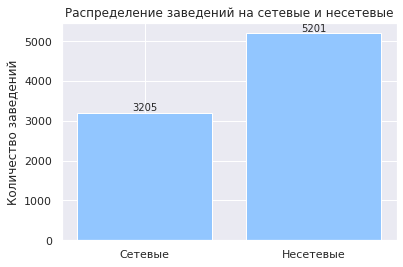

In [40]:
x = ['Сетевые', 'Несетевые']
y = [places['chain'].sum(), len(places.loc[places['chain'] == 0]['name'])]
fig, ax = plt.subplots()
ax.bar(x, y);
ax.bar_label(ax.containers[0])
plt.title('Распределение заведений на сетевые и несетевые');
plt.ylabel('Количество заведений');
plt.show();

Из графика хорошо видно, что несетевых заведений в Москве более, чем в 1.5 раза больше, чем сетевых. Но это и логично, довольно много встречается мелких единичных заведений. \
Построим круговую диаграмму, чтобы наглядну увидеть разницу долей сетевых и несетевых заведений:

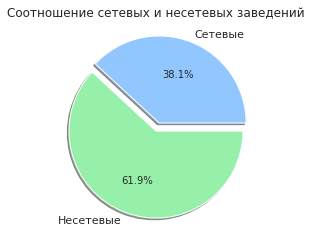

In [41]:
plt.pie(y, labels=x, 
        autopct='%1.1f%%',
        shadow=True,
        explode=(0.1,0));
plt.title('Соотношение сетевых и несетевых заведений');

Почти 62% всех заведений - несетевые. Теперь посмотрим, какие категории заведений чаще бывают сетевыми, а какие нет.

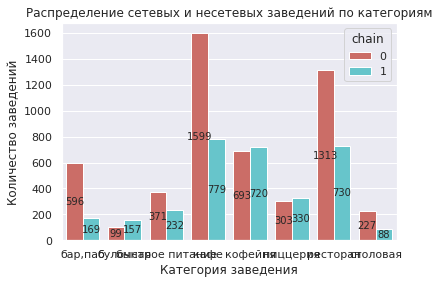

In [42]:
chains_cat = places.groupby(['category', 'chain'], as_index=False).agg({'name': 'count'})
ax = sns.barplot(x='category', y='name', hue='chain', data=chains_cat, palette='hls');
for container in ax.containers:
    ax.bar_label(container, label_type='center')
plt.title('Распределение сетевых и несетевых заведений по категориям');
plt.xlabel('Категория заведения');
plt.ylabel('Количество заведений');
plt.show()

Несетевых кафе аж в два раза больше, чем сетевых. Также подавляющее большинство баров, пабов, ресторанов являются несетевыми. Кафе быстрого питания и столовые тоже чаще не принадлежат какой-либо сети. А вот булочные, пиццерии и кофейни, напротив, чаще являются сетевыми заведениями, хотя их и меньшее количество, чем других. \
И правда, узконаправленные заведения общественного питания чаще принадлежат какой-либо сети или франшизе.

### Топ-15 популярных сетей в Москве

Выберем заведения, которые являются сетевыми, и посчитаем их количество в датасете.

In [43]:
top15 = (places.loc[places['chain'] == 1]
         .groupby('name', as_index=False)
         .agg({'address':'count'})
         .rename(columns={'address': 'cafe_cnt'})
         .sort_values(by='cafe_cnt', ascending=False)
         .head(15)
        )
top15

,name,cafe_cnt
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


Целых 120 заведений из представленных относятся к известной сети "Шоколадница", следом по популярности идут Домино'с пицца и Додо Пицца. Построим визуализацию для наглядности:

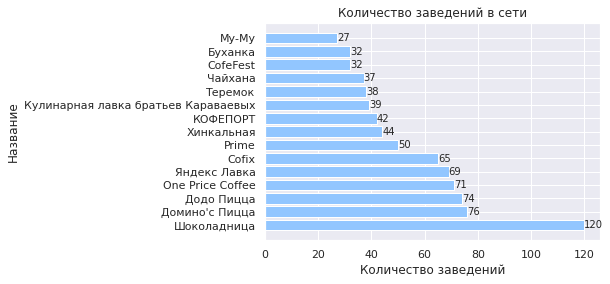

In [44]:
fig, ax = plt.subplots()
ax.barh(top15['name'], top15['cafe_cnt']);
ax.bar_label(ax.containers[0])
plt.title('Количество заведений в сети');
plt.ylabel('Название');
plt.xlabel('Количество заведений');
plt.show();

Как мы видим, популярными являются заведения, которые чаще всего "на слуху", даже в других городах. Мне, как жителю отдаленного от Москвы города, знакомы такие сети, как "Шоколадница", "ДодоПицца", "Яндекс Лавка", "Cofix". Значит, это довольно крупные сети, которые распространены по всей России. Другие заведения мне незнакомы. \
Но можно сказать, что в основном в топе представлены пиццерии, кофейни, хотя есть и более широконаправленные заведения, и хинкальные, и даже чайхана.

Посмотрим теперь, к каким категориям относятся популярные заведения.

In [45]:
top15_cat = (places.loc[places['name'].isin(top15['name'])]
             .groupby(['name', 'category'], as_index=False)
             .agg({'address': 'count'})
             .rename(columns={'address':'cnt'})
            )
top15_cat

,name,category,cnt
0,CofeFest,кафе,1
1,CofeFest,кофейня,31
2,Cofix,кофейня,65
3,One Price Coffee,кофейня,71
4,Prime,кафе,1
5,Prime,ресторан,49
6,Буханка,булочная,25
7,Буханка,кафе,1
8,Буханка,кофейня,6
9,Додо Пицца,пиццерия,74


Тут мы можем заметить, что некоторые заведения отнесены к разным категориям. Такое может быть из-за того, что данные заполняли пользователи, также это может быть связано с тем, что заведения могут быть раположены в разных местах: где-то это просто кофейня и кофе с собой, где-то это кафе, где можно посидеть. \
Но вот заведение "Му-Му" смущает тем, что включает в себя сразу все категории. Либо это дублирующие названия (хотя все заведения сетевые), либо какая-то ошибка в заполнении данных.

In [46]:
fig = px.bar(top15_cat, x='name', 
             y='cnt',
             color='category',
            title='Категории заведений в популярных сетях')
fig.show()

Благодаря визуализации отлично заметно, что заведения "Му-Му", "Буханка", "Хинкальная", "Чайхана" имеют много разных категорий. 
Ну, что касается Хинкальной и Чайханы - такие названия заведений довольно распространены, это может быть и вовсе не одна сеть, а просто заведения с одинаковыми названиями (причем юридически они будут разные, но так как информацию добавляют пользователи, на вывеске у заведения одно и то же название).

### Категории заведений по районам

Посмотрим, какие административные округи представлены в датасете

In [47]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Теперь построим таблицу и выведем график, чтобы увидеть сколько заведений каждой категории находится в каждом округе.

In [48]:
dist = places.groupby(['district', 'category'], as_index=False).agg({'name': 'count'}).rename(columns={'name':'cnt'})
dist

,district,category,cnt
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [49]:
fig = px.bar(dist, x='district', 
             y='cnt',
             color='category',
            title='Количество заведений по округам')
fig.show()

Наверное, этого следовало ожидать: более 2000 заведений находится в центральном округе, при этом большая часть из них - рестораны, далее примерно в равных долях идут кофейни и кафе. Также внушительную долю от всех заведений в центре занимают бары и пабы. Менее распостранены в центре булочные. В других же округах, в отличие от центрального, основная масса заведений представлена кафешками, рестораны лишь занимают почетные вторые и третьи места. \
Самый скудный на заведения общественного питания Северо-Западный округ, количество заведений там не достигает даже отметки в 500 штук. При этом кафе и рестораны представлены примерно в равных долях. \
Булочных же мало во всех округах. 

### Распределение рейтинга заведений по категориям

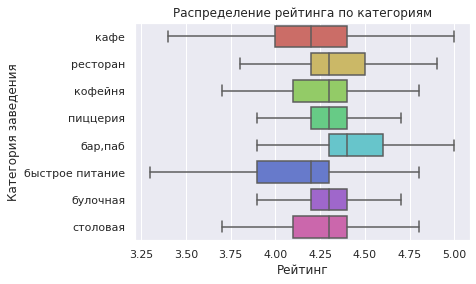

In [50]:
sns.boxplot(x='rating', y='category', data=places, palette='hls', showfliers=False);
plt.title('Распределение рейтинга по категориям');
plt.ylabel('Категория заведения');
plt.xlabel('Рейтинг');
plt.show();

Из графика мы видим, что в среднем рейтинг заведений колеблется от 4 до 4.5 При этом самый высокий рейтинг имеют бары и пабы, достигая даже оценки более 4.5. Видимо, публика таких заведений более лояльна и любит оставлять отзывы.А минимальный рейтинг из представленных имеют кафе и заведения быстрого питания, хотя и у них медианная оценка выше 4. Ниже 4 баллов рейтинг опускается только у кафе быстрого питания.\ 
В целом все заведения имеют довольно высокий рейтинг и сильно не отличаются друг от друга.

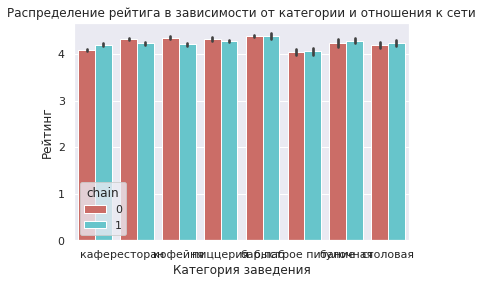

In [51]:
sns.barplot(x='category', y='rating', hue='chain', data=places, palette='hls');
plt.title('Распределение рейтига в зависимости от категории и отношения к сети');
plt.xlabel('Категория заведения');
plt.ylabel('Рейтинг');
plt.show()

Каких-то явных отличий между рейтингом сетевых и несетевых заведений нет. Есть ли какие-то отличия в рейтинге заведений популярной сети:

In [52]:
places.loc[places['name'].isin(top15['name'])]['rating'].median()

4.2

Нет, рейтинг не выходит за рамки 4-4.5, как во всем датасете.

### Геоаналитика заведений

Построим хороплет с распределением медианного рейтинга заведений по районам.

In [53]:
# посмотрим на файл с округами Москвы
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [1]:
rating_df = places.groupby('district', as_index=False)['rating'].agg('median')

NameError: name 'places' is not defined

In [54]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Как мы видим, максимальный рейтинг имеют заведения в Центральном округе, а менее доброжелательная публика в Северо- и Юго-Восточных округах.

Выведем теперь все заведения на карту:

In [54]:
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [58]:
top_streets = (places.groupby('street', as_index=False)
               .agg({'name':'count'})
               .rename(columns={'name':'places_cnt'})
               .sort_values(by='places_cnt', ascending=False)
               .head(15)
              )
top_streets

,street,places_cnt
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


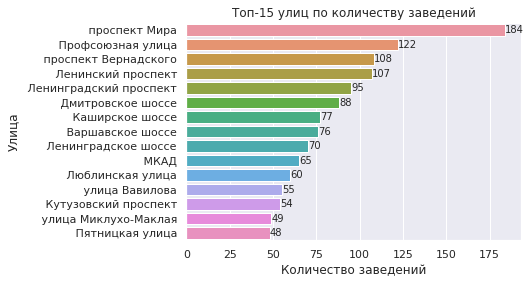

In [59]:
ax = sns.barplot(x='places_cnt', y='street', data=top_streets);
ax.bar_label(ax.containers[0])
plt.title('Топ-15 улиц по количеству заведений');
plt.xlabel('Количество заведений');
plt.ylabel('Улица');
plt.show();

Наиболее богат на заведения проспект Мира, аж 184 объекта расположено там. А вот замыкает топ-15 Пятницкая улица, там 48 заведений.
Посмотрим на распределение заведений по категориям:

In [111]:
fig = px.bar(places.loc[places['street'].isin(top_streets['street'])]
                   .groupby(['street', 'category'], as_index=False)
                   .agg({'name':'count'}),
             x='street', 
             y='name',
             color='category',
            title='Категории заведений на самых популярных улицах ')
fig.show()

В основном на всех улицах основная масса заведений - это рестораны и кафе, причем примерно в равных долях. Только в районе МКАДа кафе значительно превосходят по количеству рестораны и занимают основную массу среди всех заведений. А вот наиболее богат на бары и пабы Ленинградский проспект. \
Посмотрим, каких заведений на популярных улицах больше - сетевых или несетвых.

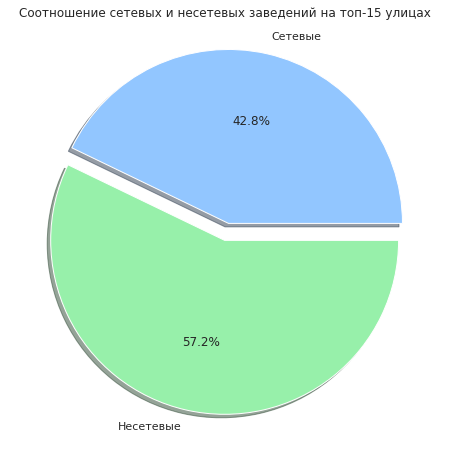

In [112]:
x = ['Сетевые', 'Несетевые']
y = [places.loc[places['street'].isin(top_streets['street'])]['chain'].sum(), \
                len(places[np.logical_and(places['street'].isin(top_streets['street']), places['chain'] == 0)])]
plt.pie(y, labels=x, 
        autopct='%1.1f%%',
        shadow=True,
        explode=(0.1,0));
plt.title('Соотношение сетевых и несетевых заведений на топ-15 улицах');

Несетевые заведения всё еще превосходят сетевые, но мы можем видеть небольшое увеличение доли сетевых. Получается, на самых популярных улицах выросла доля сетевых заведений и достигает почти 43%, во всем датасете 38% сетевых. 
Посмотрим, есть ли какие-либо отличия в медианном рейтинге на популярных улицах.

In [60]:
places.loc[places['street'].isin(top_streets['street'])]['rating'].median()

4.3

Нет, рейтинг не вышел за пределы 4-4.5, как во всем датасете.

### Улицы с одним заведением общепита

Теперь посмотрим обратную ситуацию - изучим улицы, на которых всего одно заведение общепита.

In [113]:
one = (places.groupby('street', as_index=False)
               .agg({'name':'count'})
               .rename(columns={'name':'places_cnt'})).query('places_cnt == 1')
one['street']

0         1-й Автозаводский проезд
1          1-й Балтийский переулок
2            1-й Варшавский проезд
3          1-й Вешняковский проезд
5        1-й Голутвинский переулок
                   ...            
1436                 улица Шкулёва
1437               улица Шкулёва 4
1439                  улица Шухова
1442                 улица Юннатов
1447                           № 7
Name: street, Length: 458, dtype: object

Ого, довольно много улиц Москвы имеет всего одно заведение общепита. Посмотрим, что это за заведения.

In [114]:
places.loc[places['street'].isin(one['street'])]['category'].unique()

array(['столовая', 'кафе', 'кофейня', 'ресторан', 'бар,паб',
       'быстрое питание', 'пиццерия', 'булочная'], dtype=object)

Заведения всех категорий попадают в этот список. То есть какие-то улицы имеют всего одну булочную и больше ничего, какие-то всего одну пиццерию и так далее. Посмотрим на распределение по категориям на этих улицах.

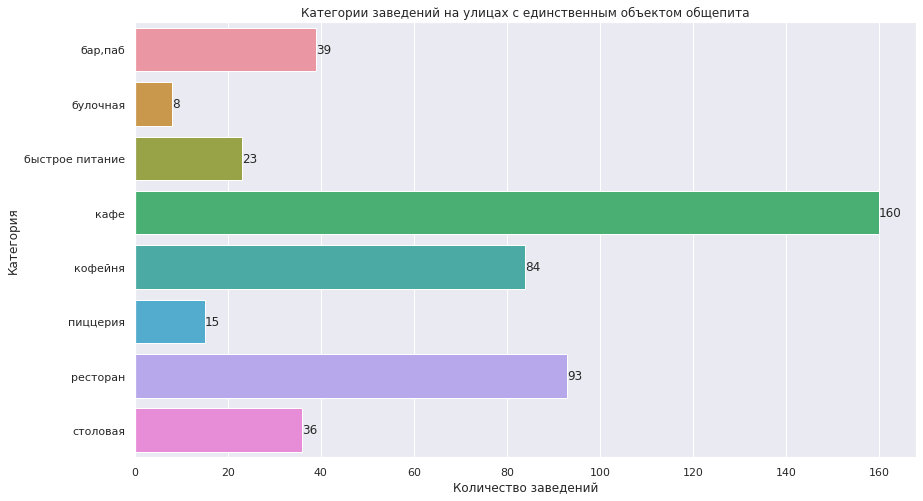

In [117]:
ax = sns.barplot(data=places.loc[places['street'].isin(one['street'])]
            .groupby('category', as_index=False).agg({'name': 'count'}),
            x = 'name', y = 'category'
           ); 
ax.bar_label(ax.containers[0])
plt.title('Категории заведений на улицах с единственным объектом общепита');
plt.xlabel('Количество заведений');
plt.ylabel('Категория');

Как мы видим из графика, на улицах с единственным заведением преобладают кафе - целых 160 улиц с кафешками, затем идут рестораны и кофейни. Меньше всего булочных, хотя и встречаются улицы только с одной булочной без кафе и ресторанов. \
Посмотрим, изменится ли здесь соотношение сетевых и несетевых заведений.

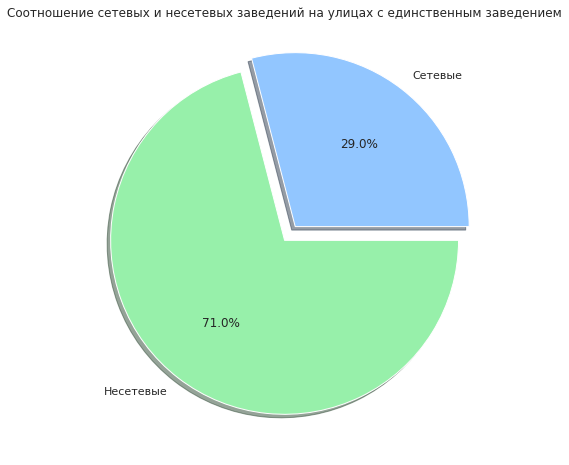

In [118]:
x = ['Сетевые', 'Несетевые']
y = [places.loc[places['street'].isin(one['street'])]['chain'].sum(), \
                len(places[np.logical_and(places['street'].isin(one['street']), places['chain'] == 0)])]
plt.pie(y, labels=x, 
        autopct='%1.1f%%',
        shadow=True,
        explode=(0.1,0));
plt.title('Соотношение сетевых и несетевых заведений на улицах с единственным заведением');

Да, мы видим, как сократилась доля сетевых заведений на таких улицах. Оставляет всего 29%.
Изменился ли как-то рейтинг на этих улицах?

In [65]:
places.loc[places['street'].isin(one['street'])]['rating'].median()

4.3

Нет, рейтинг в тех же пределах.

### Распределение среднего чека по районам

In [119]:
# для начала создадим таблицу с медианными значениями среднего чека
bill_dist = (places.groupby('district', as_index=False)
             .agg({'middle_avg_bill':'median'})
             .rename(columns={'middle_avg_bill':'median_bill'})
            )
bill_dist

,district,median_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Теперь построим хороплет:

In [120]:
# создадим еще одну карту
m_1 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_dist,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m_1)

# выводим карту
m_1

Как мы видим, имеется довольно большой размах среднего чека: от 450 рублей до 1000 рублей. При этом максимальный средний чек в Центральном и Западном округах. А вот дешевле всего в заведениях Юго-Восточного округа.

### Круглосуточные заведения

In [121]:
# сколько всего круглосуточных заведений
len(places.loc[places['is_24/7'] == True])

730

Относительно всего датасета не так и много. \
Посмотрим, в каких районах чаще располагаются круглосуточные заведения, а также к каким категориям они относятся.

In [122]:
is_24_7 = places.loc[places['is_24/7'] == True].groupby('district', as_index=False).agg({'name':'count'}) \
.rename(columns={'name': 'cnt'}). sort_values(by='cnt', ascending=False)
is_24_7

,district,cnt
5,Центральный административный округ,131
0,Восточный административный округ,97
6,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
8,Южный административный округ,75
7,Юго-Западный административный округ,73
1,Западный административный округ,72
2,Северный административный округ,71
4,Северо-Западный административный округ,43


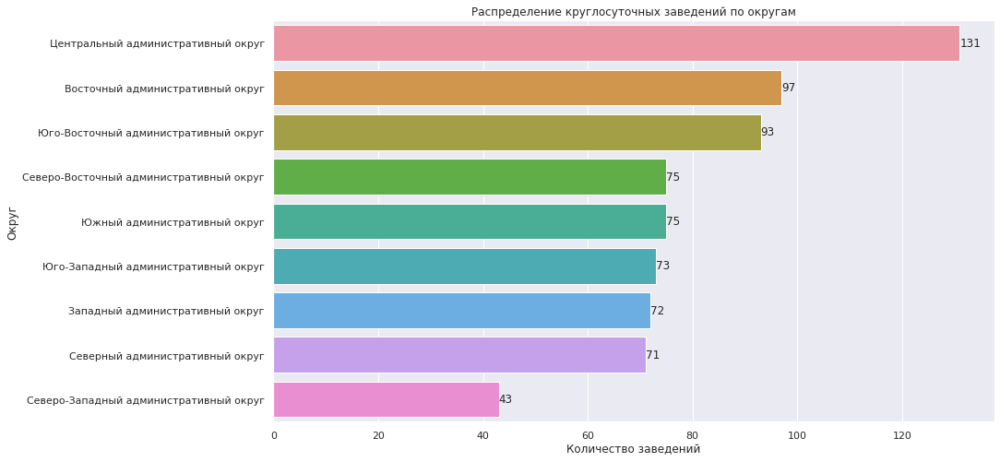

In [124]:
ax= sns.barplot(data=is_24_7, x='cnt', y='district');
ax.bar_label(ax.containers[0])
plt.title('Распределение круглосуточных заведений по округам');
plt.xlabel('Количество заведений');
plt.ylabel('Округ');
plt.show();

Ну, примерно этого и следовало ожидать, больше всего круглосуточных зведений в Центральном округе, а вот в Северо-Западном минимальное количество таких объектов.

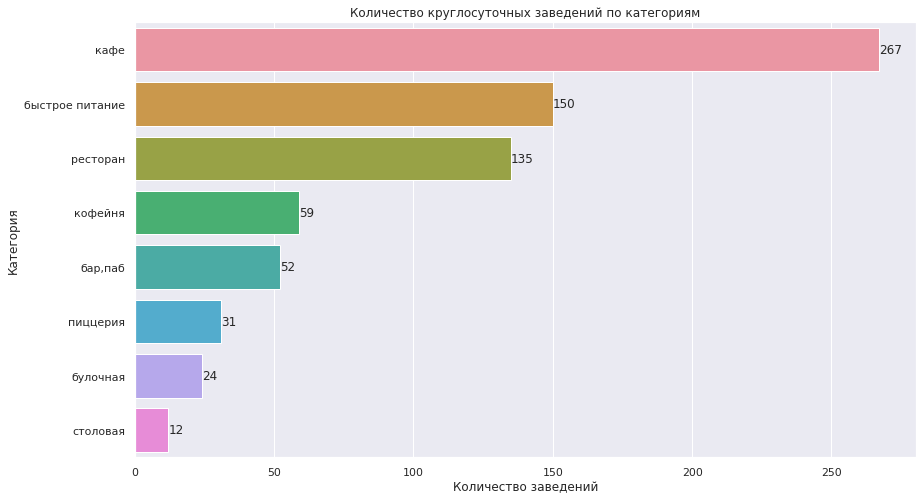

In [126]:
ax = sns.barplot(data = places.loc[places['is_24/7'] == True].groupby('category', as_index=False).agg({'name':'count'})
            .sort_values(by='name', ascending=False),
            x = 'name', y = 'category');
ax.bar_label(ax.containers[0])
plt.title('Количество круглосуточных заведений по категориям');
plt.xlabel('Количество заведений');
plt.ylabel('Категория');
plt.show();

Более трети всех круглосуточных заведений - это кафе. Затем идут кафе быстрого питания и рестораны. А вот реже всего круглосуточными бывают столовые. \
Так как кафе, в принципе, самая многочисленная группа, не совсем точно смотреть количество заведений по абсолютным числам. Посомтрим на долю круглосуточных в каждой группе.

In [133]:
for cat in places['category'].unique():
    print(f'{cat}: {round(places.loc[places["category"] == cat]["is_24/7"].sum()*100 / len(places.loc[places["category"] == cat]),2)} \
    % круглосуточных заведений')

кафе: 11.23     % круглосуточных заведений
ресторан: 6.61     % круглосуточных заведений
кофейня: 4.18     % круглосуточных заведений
пиццерия: 4.9     % круглосуточных заведений
бар,паб: 6.8     % круглосуточных заведений
быстрое питание: 24.88     % круглосуточных заведений
булочная: 9.38     % круглосуточных заведений
столовая: 3.81     % круглосуточных заведений


Вот и поменялась картинка - получается, больше всего круглосуточных заведений среди кафе быстрого питания. Кафе лишь на втором месте. А следом идут вовсе не рестораны, а булочные. \
А вот меньше всего таких заведений в столовых, тут всё верно.

### Заведения с низким рейтингом

Как мы установили выше, в среднем рейтинг по во всех категориях заведений выше 4, однако есть объекты с низких рейтингом, посмотрим, сколько таких и что это за заведения. Возьмем низкий рейтинг от 3.

In [134]:
len(places.loc[places['rating'] <= 3])

234

Не очень много таких заведений. К каким категориям они чаще относятся:

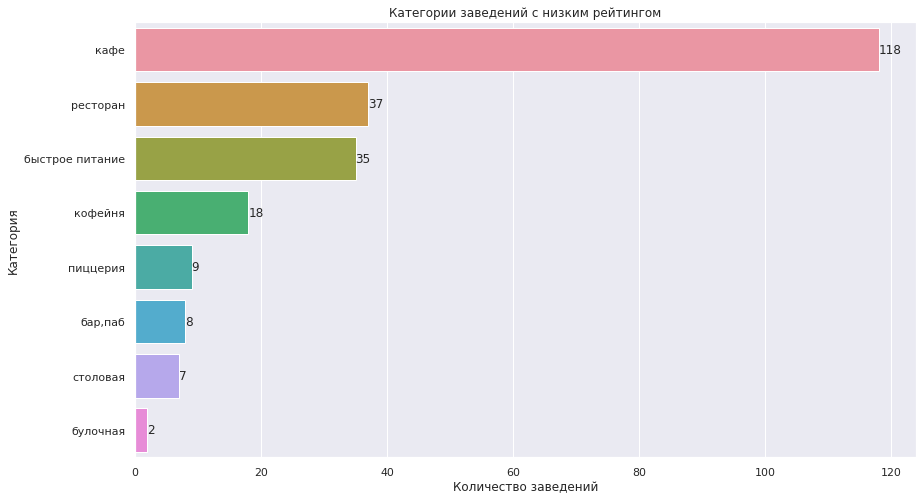

In [136]:
ax = sns.barplot(data = places.loc[places['rating'] <= 3].groupby('category', as_index=False).agg({'name': 'count'})
            .sort_values(by='name', ascending=False),
            x = 'name', y = 'category'
           );
ax.bar_label(ax.containers[0])
plt.title('Категории заведений с низким рейтингом');
plt.xlabel('Количество заведений');
plt.ylabel('Категория');
plt.show();

И снова мы видим в лидерах самую многочисленную группу. Но, как в случае с предыдущим шагом, нужно посмотреть доли от каждой категории, чтобы лучше понять картину.

In [139]:
for cat in places['category'].unique():
    print(f'{cat}: {round(len(places.loc[np.logical_and(places["category"] == cat, places["rating"] <= 3)])*100 / len(places.loc[places["category"] == cat]),2)} \
    % заведений с низким рейтингом')

кафе: 4.96     % заведений с низким рейтингом
ресторан: 1.81     % заведений с низким рейтингом
кофейня: 1.27     % заведений с низким рейтингом
пиццерия: 1.42     % заведений с низким рейтингом
бар,паб: 1.05     % заведений с низким рейтингом
быстрое питание: 5.8     % заведений с низким рейтингом
булочная: 0.78     % заведений с низким рейтингом
столовая: 2.22     % заведений с низким рейтингом


Здесь тоже благодаря долям картинка немного изменилась - больше всего заведений с низким рейтингом среди кафе быстрого питания. Самая благодарная публика у булочных, здесь менее 1% заведений ставят низкий рейтинг. 

**Выводы:** 
- Самая многочисленная категория заведений в Москве (исходя из этого датасета) - кафе. На втором месте идут рестораны, затем кофейни. Реже всего встречаются булочные и столовые.

- В среднем количество посадочных мест в заведениях колеблется до 100, чаще всего встречаются 40-50 местные объекты. Хотя есть и довольно крупные места на 200-300 человек, такие заведения относят к общегородским, согласно документации. Приэтом наибольшее количество посадочных мест имеют рестораны, медиана там более 80, с небольшим отставанием далее идут бары и пабы с медианой ровно 80 и кофейни. С минимальной вместительностью в Москве булочные. При этом в большей части категорий сетевые заведения являются более крупными, чем несетевые. А вот в пиццериях, барах и булочных заведения, не относящиеся к какой-либо сети, имеют большее количество посадочных мест.

- Несетевых заведений значительно больше, чем сетевых. Их доли составляют 62% и 38% соответственно. При этом чаще к какой-либо сети относятся узконаправленные заведения такие, как булочные, пиццерии кофейни. Количество сетевых заведений среди них превышает несетевые.

- В ходе исследования мы нашли самые популярные сети в Москве к ним относятся Шоколадница, Домино'с пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix и другие. Эти сети, действительно, довольно популярны и являются общероссийскими, есть в разных городах. Однако благодаря этому шагу были обнаружены и неточности в данных: некоторые заведения имеют разные категории. Например, обнаружено заведение "Му-Му", которое отмечено в датасете всеми восемью категориями. Скорее всего, это связано с тем, что заполняют данные пользователи, а, может быть, это такие неявные дубликаты с похожими названиями.

- Было изучено распределение заведений по округам, выяснено, что самый богатый на объекты общепита Центральный округ - более 2000 заведений находятся там. При этом основная масса представлена ресторанами, дальше идут кафе и кофейни в равных долях. В других округах кафе лидируют по количеству, ресторанам досталось лишь второе или третье место. Самый скудный на заведения общепита Северо-Западный округ, там количество объектов не достигает и 500 штук. 

- Изучен рейтинг заведений. И здесь мы имеем довольно приятную картину - в среднем медианный рейтинг колеблется от 4 до 4.5, при этом самый высокий рейтинг имеют бары и пабы, ниже 4 баллов рейтинг опускается только у кафе быстрого питания. Но в целом рейтинг заведений выше среднего и резких отличий нет ни по округам, ни по категориям, ни по отношению к сети.

- Выделен список топ-15 улиц по количеству заведений. В него вошли проспект Мира, Профсоюзная улица, проспекты Вернадского, Ленинский и другие. При этом больше всего объектов общественного питания располагается на проспекте Мира, аж 184 заведения, замыкает список лидеров Пятницкая улица с 48 объектами. В основном на всех улицах распространены рестораны и кафе примерно в равных долях, только в районе МКАДа кафе значительно превосходят все остальные категории. Наиболее богат на бары и пабы Ленинградский проспект. Также на популярных улицах можно заметить небольшое смещение в сторону сетевых заведений, их доля здесь немного выше и составляет 43%.

- Также обнаружено 458 улиц с единственным объектом общественного питания. Чаще всего это кафе, затем идут рестораны и кофейни. Встречаются даже улицы с одной булочной без других заведений, но их самое немногочисленное количество. И на таких улицах мы видим смещение в сторону несетвых заведений, доля сетевых здесь сократилась до 29%.

- Дальше было изучено распределение среднего чека по районам. Мы обнаружили довольно большое колебание среднего чека от 450 до 1000 рублей. При этом максимальный чек можно обнаружить в заведениях Центрального и Западного округа, а вот самые демократичные цены в Юго-Восточном округе.

- В датасете представлена 730 заведений с круглосуточным режимом работы. Чаще такие заведения можно встретить в Центральном округе, а вот реже всего круглосуточные объекты встречаются в Северо-Западном округе. Почти четверть из кафе быстрого питания - круглосуточные, на втором месте по частоте работы 24/7 идут кафе. реже всего круглые сутки работают столовые.

- Выделено 234 заведения с рейтингом ниже 3, было выяснено, что чаще такие заведения встречаются среди кафе быстрого питания. А вот самая благодарная публика у булочных, здесь низкий рейтинг имеет менее 1% заведений.

## Шаг 4: Детализация исследование: открытие кофейни

Наш заказчик планирует открыть кофейню. Поэтому нужно более детально изучить их расположение рейтинг и закономерности в датсете, чтобы дать рекомендации фонду.

In [140]:
# посмотрим, сколько всего кофеен в датасете
coffeshop = places.loc[places['category'] == 'кофейня']
len(coffeshop)

1413

Да, кофеен в Москве довольно много. Посмотрим, в каких районах они чаще располагаются.

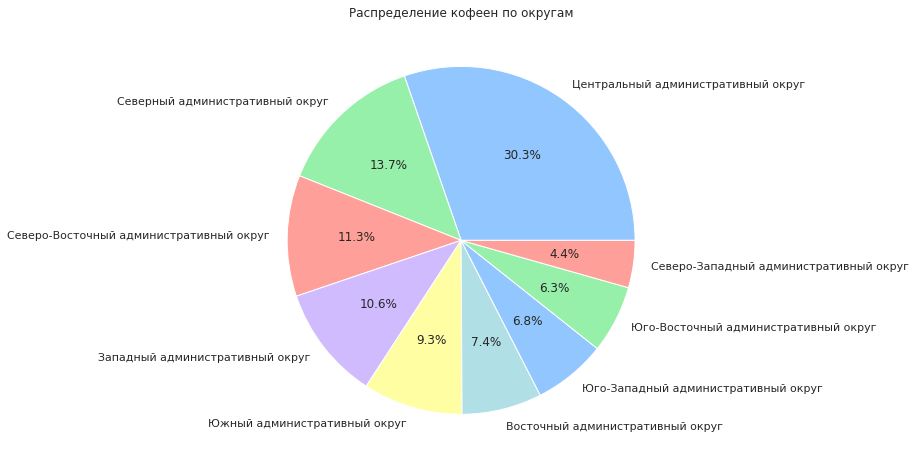

In [141]:
coffeshop['district'].value_counts().plot(kind = 'pie',
                                          autopct='%1.1f%%',
                                          ylabel = '',
                                          title = 'Распределение кофеен по округам'
                                         );
                                          

Основная масса кофеен расположена в Центральном округе (30% от всех), на втором месте Северный округ. Меньше всего кофеен в Северо-Западном округе.

Изучим подробнее расположение на карте:

In [142]:
m_2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster_2 = MarkerCluster().add_to(m_2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_2)

# применяем функцию create_clusters() к каждой строке датафрейма
coffeshop.apply(create_clusters, axis=1)

# выводим карту
m_2

Довольно много кофеен расположено в торговых центрах, возле офисов, школ, есть даже кофейни в поликлиниках и больницах. То есть там, где есть большое скопление людей. Есть ли круглосуточные кофейни?

In [143]:
coffeshop['is_24/7'].sum()

59

Да, 59 кофеен являются круглосуточными. Посмотрим, в каких районах расположены они.

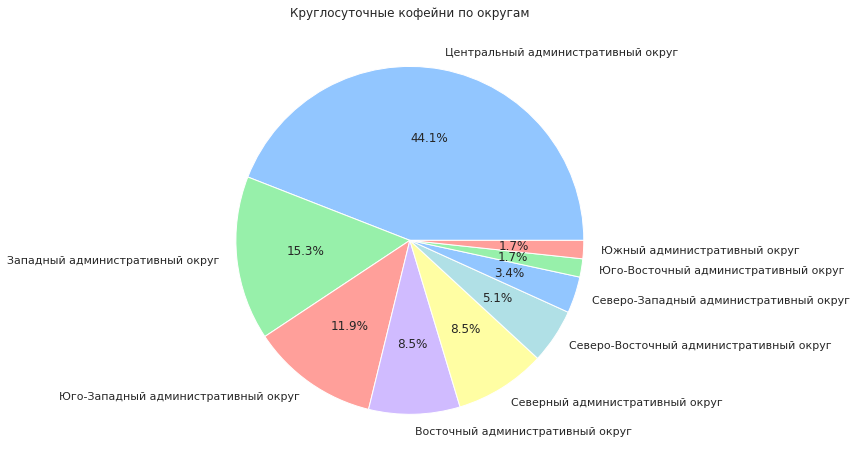

In [144]:
coffeshop.loc[coffeshop['is_24/7'] == True]['district'].value_counts().plot(kind = 'pie',
                                          autopct='%1.1f%%',
                                          ylabel = '',
                                          title = 'Круглосуточные кофейни по округам'
                                         );

Конечно, почти половина круглосуточных кофеен в Центральном округе. Меньше всего такх кофеен в Южном и Юго-Восточном округах.
Посмотрим, каких кофеен больше - сетевых или нет.

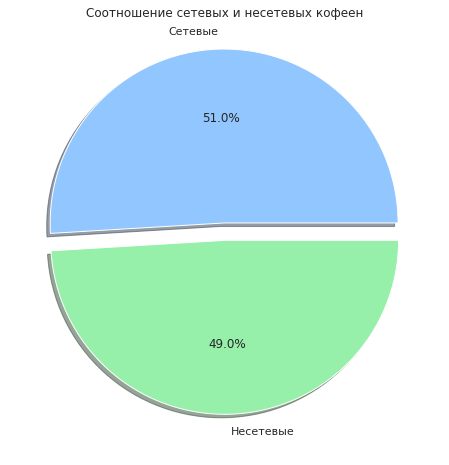

In [145]:
x = ['Сетевые', 'Несетевые']
y = [coffeshop['chain'].sum(), \
                len(coffeshop.loc[coffeshop['chain'] == 0])]
plt.pie(y, labels=x, 
        autopct='%1.1f%%',
        shadow=True,
        explode=(0.1,0));
plt.title('Соотношение сетевых и несетевых кофеен');

Ого, значит сетевые и несетвые кофейни находятся примерно в равных долях. Сетевые даже немного преобладают (51% на 49%).

Как распределено количество посадочных мест в кофейнях:

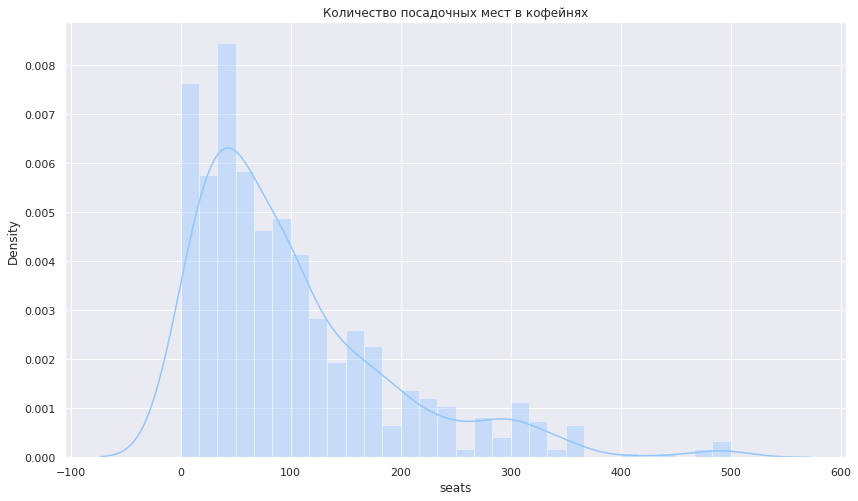

In [146]:
sns.distplot(coffeshop.loc[coffeshop['seats'] < 625]['seats'], bins=30);
plt.title('Количество посадочных мест в кофейнях');

Здесь нет сильных отличий от всего датасета. Хотя кофейни, где 200 и более мест - это странно.

Изучим рейтинг и что может на него влиять:

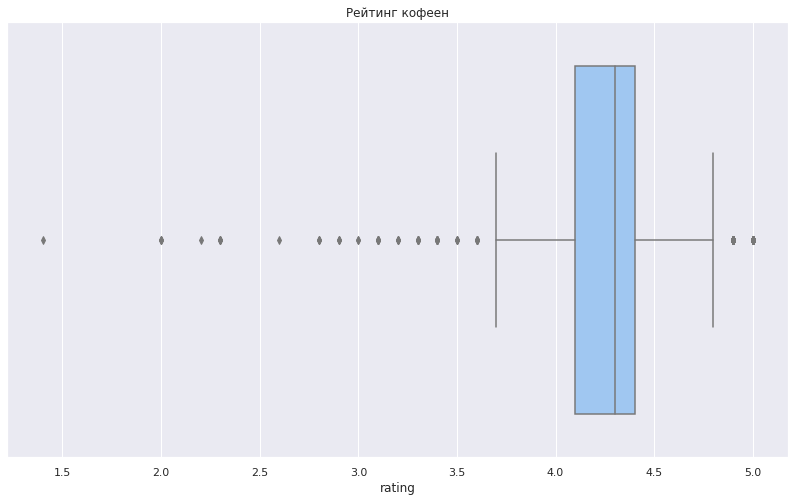

In [147]:
sns.boxplot(coffeshop['rating']);
plt.title('Рейтинг кофеен');

Довольно неплохой медианный рейтинг, хотя есть и выбросы, интересно посмотреть и на них. Но пока разберемся с округами.

In [148]:
# найдем медианный рейтинг по округам
rating_coffee = coffeshop.groupby('district', as_index=False).agg({'rating':'median'})
rating_coffee

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


О как, не думаю, что есть большой смысл строить хороплет. И так хорошо видно, что медианный рейтинг по округам одинаков, лишь в Западном округе на 0.1 ниже.

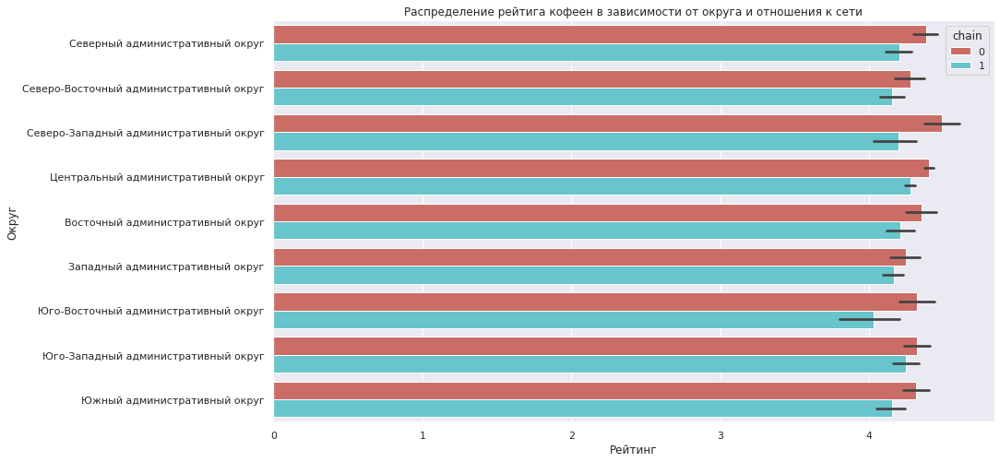

In [149]:
# есть ли зависимость рейтинга от отношения к сети
sns.barplot(y='district', x='rating', hue='chain', data=coffeshop, palette='hls');
plt.title('Распределение рейтига кофеен в зависимости от округа и отношения к сети');
plt.ylabel('Округ');
plt.xlabel('Рейтинг');
plt.show()

Несетевые кофейни имеют более высокий рейтинг, однако различия незначительны. Но есть. И во всех округах.

Проверим, есть ли отличия в рейтинге у круглосуточных кофеен.

In [150]:
print('Медианный рейтинг круглосуточных кофеен:', coffeshop.loc[coffeshop['is_24/7'] == True]['rating'].median())

Медианный рейтинг круглосуточных кофеен: 4.2


In [151]:
print('Медианный рейтинг не круглосуточных кофеен:', coffeshop.loc[coffeshop['is_24/7'] == False]['rating'].median())

Медианный рейтинг не круглосуточных кофеен: 4.3


Как мы видим, явных отличий нет.

In [152]:
# сколько кофеен имеет низкий рейтинг
len(coffeshop.loc[coffeshop['rating'] <= 3])

18

In [153]:
# в каких районах доля кофеен с низким рейтингом выше
for dist in coffeshop['district'].unique():
    print(f'{dist}: {round(len(coffeshop.loc[np.logical_and(coffeshop["district"] == dist, coffeshop["rating"] <= 3)])*100 / len(coffeshop.loc[coffeshop["district"] == dist]),2)} \
    % заведений с низким рейтингом')

Северный административный округ: 2.07     % заведений с низким рейтингом
Северо-Восточный административный округ: 1.89     % заведений с низким рейтингом
Северо-Западный административный округ: 1.61     % заведений с низким рейтингом
Центральный административный округ: 0.23     % заведений с низким рейтингом
Восточный административный округ: 0.95     % заведений с низким рейтингом
Западный административный округ: 1.33     % заведений с низким рейтингом
Юго-Восточный административный округ: 5.62     % заведений с низким рейтингом
Юго-Западный административный округ: 0.0     % заведений с низким рейтингом
Южный административный округ: 0.76     % заведений с низким рейтингом


Больше всего кофеен с низким рейтингом в Юго-Восточном округе, а вот в Юго-Западном вообще нет таких кофеен.

In [154]:
# посмотрим на кофейни с высоким рейтингом
len(coffeshop.loc[coffeshop['rating'] == 5])

37

In [155]:
# посмотрим на доли таких кофеен в округах
for dist in coffeshop['district'].unique():
    print(f'{dist}: {round(len(coffeshop.loc[np.logical_and(coffeshop["district"] == dist, coffeshop["rating"] == 5)])*100 / len(coffeshop.loc[coffeshop["district"] == dist]),2)} \
    % заведений с высоким рейтингом')

Северный административный округ: 6.74     % заведений с высоким рейтингом
Северо-Восточный административный округ: 0.63     % заведений с высоким рейтингом
Северо-Западный административный округ: 6.45     % заведений с высоким рейтингом
Центральный административный округ: 1.17     % заведений с высоким рейтингом
Восточный административный округ: 3.81     % заведений с высоким рейтингом
Западный административный округ: 2.0     % заведений с высоким рейтингом
Юго-Восточный административный округ: 4.49     % заведений с высоким рейтингом
Юго-Западный административный округ: 1.04     % заведений с высоким рейтингом
Южный административный округ: 1.53     % заведений с высоким рейтингом


Чаще всего кофейню с высоким ретингом можно встретить в Северном и Северо-Западном округах. А вот реже пятерки ставят в Северо-Восточном округе.

Изучим теперь стоимость чашки капучино в кофейнях.

In [156]:
# для начала создадим таблицу с медианными значениями стоимости
cup_dist = (coffeshop.groupby('district', as_index=False)
             .agg({'middle_coffee_cup':'median'})
             .rename(columns={'middle_coffee_cup':'median_price'})
            )
cup_dist.sort_values(by='median_price')

,district,median_price
0,Восточный административный округ,135.0
6,Юго-Восточный административный округ,147.5
8,Южный административный округ,150.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
1,Западный административный округ,189.0
5,Центральный административный округ,190.0
7,Юго-Западный административный округ,198.0


In [157]:
# медиана медиан
cup_dist['median_price'].median()

162.5

In [158]:
# построим хороплет
cof = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_dist,
    columns=['district', 'median_price'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино по районам',
).add_to(cof)

# выводим карту
cof

Медианная стоимость чашки кофе располагается от 135 до 198 рублей. При этом самая высокая цена в Юго-Западном округе, она на 8 рублей превышает даже Центральный. А самую дешевую чашечку капучино можно выпить в Восточном округе.

**Выводы:**

- В Москве, по информации из датасета, имеется 1413 кофеен. При этом основная масса расположена в Центральном округе (30% кофеен), затем по популярности идет Северный округ. Меньше всего кофеен в Северо-Западном округе.

- Чаще кофейни располагаются в местах большого скопления людей: в торговых центрах, возле офисов, возле метров, возле школ, даже можно встретить в поликлниках и больницах.

- Есть кофейни с круглосуточной работой, их всего 59 штук. Чаще всего такие кофейни расположены в Центральном округе, меньше всего распространены круглсоуточные кофейни в Юго-Восточном округе.

- Соотношение сетевых и несетевых кофеен примерно равно и составляет: сетевых 51%, несетвых 49%.

- Кофейни имеют довольно высокий медианный рейтинг. Несетевые кофейни оценивают чуть выше, однако значительных отличий нет. В зависимости от округов и режима работы рейтинг тоже не отличается.

- Более детально были изучены кофейни с низким рейтингом, большая доля таких расположена в Юго-Восточном округе. При этом в Юго-Западном нет кофеен с рейтингом 3 и ниже.

- Имеется 37 кофеен с рейтингом 5. Чаще всего такие высокооцененные кофейни можно встретить в Северном и Северо-Западном округах. А вот реже пятерки ставят в Северо-Восточном округе.

- Стоимость чашки капучино варьируется от 135 до 198 рублей. При этом самая высокая цена в Юго-Западном округе, перегоняет даже центр, а самую дешевую чашечку капучино можно выпить в Восточном округе.

**Практические рекомендации:** \
Имеется довольно высокая конкуренция для открытия кофейни в Москве. Наиболее багоприятные места для открытия вблизи офисов, школ, станций метро или каких-либо заведений с большим количеством людей. В некоторых ТЦ есть по 2-3 кофейни, там открывать было бы не рационально, стоит поискать ТЦ без кофеен или офисные здания, где еще нет рядом кофейни. \
Стоит рассмотреть Северо-Западный округ прицельнее: там меньше всего кофеен, при этом большая доля из имеющихся имеет максимальный рейтинг, в этом округе редко ставят оценку 3 и ниже. Стоит поискать свободные места возле офисов, метро, ТЦ, школ там. \
Открывать круглосуточную кофейню пока нет смысла. Они не имеют каких-то привелегий в рейтинге, зато затрат на обслуживание помещения и на зарплаты сотрудникам точно больше. Хоть круглосуточных кофеен и немного. Стоит подробнее изучить, пользуются ли они вообще спросом. \
Медианная стоимость чашечки капучино колеблется от 135 до 198 рублей. При этом медиана медианных стоимостей 162 рубля. Можно назначить стоимость чашки капучино 160 рублей. А лучше выбрать цену в зависимости от района, например, для Северо-Западного медиана 165 рублей, значит, если открывать кофейню там, такую стоимость и назначить.

Для ознакомления с результатами исследования добавляю презентацию: https://disk.yandex.ru/i/ijCPADu4-RpT2Q